In [1]:
import pandas as pd  # Data manipulation and analysis
import numpy as np  # Numerical computations and array operations
import matplotlib.pyplot as plt  # Plotting and visualization
import seaborn as sns  # Advanced statistical data visualization
import plotly.express as px  # Interactive plots and dashboards
import bokeh.plotting as bp  # Interactive web-based visualization
from bokeh.io import output_notebook, show  # Enable Bokeh plots in Jupyter Notebook
from sklearn.preprocessing import StandardScaler, LabelEncoder  # Data scaling and encoding categorical variables
from sklearn.ensemble import RandomForestClassifier  # Machine learning model for classification
from sklearn.model_selection import train_test_split  # Splitting dataset into training and testing sets
from sklearn.impute import SimpleImputer  # Handling missing values
from sklearn.feature_selection import mutual_info_classif  # Feature selection based on mutual information

In [2]:
# Set Pandas options to display all rows and columns
#pd.set_option('display.max_rows', None)  # Show all rows
#pd.set_option('display.max_columns', None)  # Show all columns
#pd.set_option('display.width', 1000)  # Adjust display width for better readability

In [3]:
# Load dataset
file_path = '/Users/DrVaniV/NMIT/STTP_Day3_DAV /waze_dataset.csv'
df = pd.read_csv(file_path)
df

,ID,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device,label
0,0,283,226,296.748273,2276,208,0,2628.845068,1985.775061,28,19,Android,retained
1,1,133,107,326.896596,1225,19,64,13715.920550,3160.472914,13,11,iPhone,retained
2,2,114,95,135.522926,2651,0,0,3059.148818,1610.735904,14,8,Android,retained
3,3,49,40,67.589221,15,322,7,913.591123,587.196542,7,3,iPhone,retained
4,4,84,68,168.247020,1562,166,5,3950.202008,1219.555924,27,18,Android,retained
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14994,14994,60,55,207.875622,140,317,0,2890.496901,2186.155708,25,17,iPhone,retained
14995,14995,42,35,187.670313,2505,15,10,4062.575194,1208.583193,25,20,Android,retained
14996,14996,273,219,422.017241,1873,17,0,3097.825028,1031.278706,18,17,iPhone,retained
14997,14997,149,120,180.524184,3150,45,0,4051.758549,254.187763,6,6,iPhone,churned


In [4]:
df.info() # to know the data types of the columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       14999 non-null  int64  
 1   sessions                 14999 non-null  int64  
 2   drives                   14999 non-null  int64  
 3   total_sessions           14999 non-null  float64
 4   n_days_after_onboarding  14999 non-null  int64  
 5   total_navigations_fav1   14999 non-null  int64  
 6   total_navigations_fav2   14999 non-null  int64  
 7   driven_km_drives         14999 non-null  float64
 8   duration_minutes_drives  14999 non-null  float64
 9   activity_days            14999 non-null  int64  
 10  driving_days             14999 non-null  int64  
 11  device                   14999 non-null  object 
 12  label                    14299 non-null  object 
dtypes: float64(3), int64(8), object(2)
memory usage: 1.5+ MB


In [5]:
df.describe() # to get the descriptive statistics

,ID,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days
count,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000
mean,7499.000000,80.633776,67.281152,189.964447,1749.837789,121.605974,29.672512,4039.340921,1860.976012,15.537102,12.179879
std,4329.982679,80.699065,65.913872,136.405128,1008.513876,148.121544,45.394651,2502.149334,1446.702288,9.004655,7.824036
min,0.000000,0.000000,0.000000,0.220211,4.000000,0.000000,0.000000,60.441250,18.282082,0.000000,0.000000
25%,3749.500000,23.000000,20.000000,90.661156,878.000000,9.000000,0.000000,2212.600607,835.996260,8.000000,5.000000
50%,7499.000000,56.000000,48.000000,159.568115,1741.000000,71.000000,9.000000,3493.858085,1478.249859,16.000000,12.000000
75%,11248.500000,112.000000,93.000000,254.192341,2623.500000,178.000000,43.000000,5289.861262,2464.362632,23.000000,19.000000
max,14998.000000,743.000000,596.000000,1216.154633,3500.000000,1236.000000,415.000000,21183.401890,15851.727160,31.000000,30.000000


In [6]:
df.columns # to get the column names 

Index(['ID', 'sessions', 'drives', 'total_sessions', 'n_days_after_onboarding',
       'total_navigations_fav1', 'total_navigations_fav2', 'driven_km_drives',
       'duration_minutes_drives', 'activity_days', 'driving_days', 'device',
       'label'],
      dtype='object')

In [7]:
df.isna().sum()# checking for missing values

ID                           0
sessions                     0
drives                       0
total_sessions               0
n_days_after_onboarding      0
total_navigations_fav1       0
total_navigations_fav2       0
driven_km_drives             0
duration_minutes_drives      0
activity_days                0
driving_days                 0
device                       0
label                      700
dtype: int64

In [8]:
#Handling missing values by removing those rows
df.dropna(inplace=True,axis=0)  # Drop rows with any remaining missing values

In [9]:
df.drop(columns=['ID'],inplace=True)
df.head()

,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device,label
0,283,226,296.748273,2276,208,0,2628.845068,1985.775061,28,19,Android,retained
1,133,107,326.896596,1225,19,64,13715.920550,3160.472914,13,11,iPhone,retained
2,114,95,135.522926,2651,0,0,3059.148818,1610.735904,14,8,Android,retained
3,49,40,67.589221,15,322,7,913.591123,587.196542,7,3,iPhone,retained
4,84,68,168.247020,1562,166,5,3950.202008,1219.555924,27,18,Android,retained


In [11]:
# Extract only numeric columns
numeric_df = df.select_dtypes(include=['number'])

# Display the numeric DataFrame
numeric_df.head()

,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days
0,283,226,296.748273,2276,208,0,2628.845068,1985.775061,28,19
1,133,107,326.896596,1225,19,64,13715.920550,3160.472914,13,11
2,114,95,135.522926,2651,0,0,3059.148818,1610.735904,14,8
3,49,40,67.589221,15,322,7,913.591123,587.196542,7,3
4,84,68,168.247020,1562,166,5,3950.202008,1219.555924,27,18


In [12]:
# Data Transformation
scaler = StandardScaler() # z score normalization or standardization with mean = 0, SD = 1
df_scaled = pd.DataFrame(scaler.fit_transform(numeric_df), columns=numeric_df.columns)  # Apply StandardScaler

# Display first few rows of transformed data
df_scaled.head()


,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days
0,2.506713,2.407221,0.787171,0.519693,0.583939,-0.653556,-0.565117,0.083963,1.381506,0.870290
1,0.648753,0.602687,1.008549,-0.522316,-0.695610,0.757712,3.861055,0.895244,-0.282245,-0.150957
2,0.413411,0.420717,-0.396699,0.891485,-0.824242,-0.653556,-0.393332,-0.175050,-0.171328,-0.533924
3,-0.391705,-0.413311,-0.895533,-1.721964,1.355731,-0.499198,-1.249879,-0.881936,-0.947745,-1.172204
4,0.041819,0.011285,-0.156408,-0.188199,0.299595,-0.543300,-0.037606,-0.445210,1.270590,0.742634


In [13]:
# Encode categorical variables
label_encoder = LabelEncoder()
df_scaled['device'] = label_encoder.fit_transform(df['device'])
df_scaled['label'] = label_encoder.fit_transform(df['label'])  # Encoding target variable
df_scaled.head()


,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device,label
0,2.506713,2.407221,0.787171,0.519693,0.583939,-0.653556,-0.565117,0.083963,1.381506,0.870290,0,1
1,0.648753,0.602687,1.008549,-0.522316,-0.695610,0.757712,3.861055,0.895244,-0.282245,-0.150957,1,1
2,0.413411,0.420717,-0.396699,0.891485,-0.824242,-0.653556,-0.393332,-0.175050,-0.171328,-0.533924,0,1
3,-0.391705,-0.413311,-0.895533,-1.721964,1.355731,-0.499198,-1.249879,-0.881936,-0.947745,-1.172204,1,1
4,0.041819,0.011285,-0.156408,-0.188199,0.299595,-0.543300,-0.037606,-0.445210,1.270590,0.742634,0,1


In [14]:
#  Feature Engineering
df_scaled['drives_per_day'] = df_scaled['drives'] / (df_scaled['n_days_after_onboarding'] + 1)
df_scaled['sessions_per_drive'] = df_scaled['sessions'] / (df_scaled['drives'] + 1)
df_scaled['avg_driven_km_per_drive'] =df_scaled['driven_km_drives'] / (df_scaled['drives'] + 1)
df_scaled.head()

,sessions,drives,total_sessions,n_days_after_onboarding,total_navigations_fav1,total_navigations_fav2,driven_km_drives,duration_minutes_drives,activity_days,driving_days,device,label,drives_per_day,sessions_per_drive,avg_driven_km_per_drive
0,2.506713,2.407221,0.787171,0.519693,0.583939,-0.653556,-0.565117,0.083963,1.381506,0.870290,0,1,1.584018,0.735706,-0.165859
1,0.648753,0.602687,1.008549,-0.522316,-0.695610,0.757712,3.861055,0.895244,-0.282245,-0.150957,1,1,1.261684,0.404791,2.409114
2,0.413411,0.420717,-0.396699,0.891485,-0.824242,-0.653556,-0.393332,-0.175050,-0.171328,-0.533924,0,1,0.222427,0.290987,-0.276854
3,-0.391705,-0.413311,-0.895533,-1.721964,1.355731,-0.499198,-1.249879,-0.881936,-0.947745,-1.172204,1,1,0.572482,-0.667655,-2.130397
4,0.041819,0.011285,-0.156408,-0.188199,0.299595,-0.543300,-0.037606,-0.445210,1.270590,0.742634,0,1,0.013901,0.041352,-0.037187


In [15]:
# Feature Importance
X = df_scaled.drop(columns=['label'])
y = df_scaled['label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Mutual Information for feature importance
feature_importance = mutual_info_classif(X_train, y_train)
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importance})
feature_importance_df.sort_values(by='Importance', ascending=False, inplace=True)
feature_importance_df

,Feature,Importance
9,driving_days,0.049205
8,activity_days,0.047071
4,total_navigations_fav1,0.005597
12,sessions_per_drive,0.005019
10,device,0.004753
2,total_sessions,0.004491
11,drives_per_day,0.004038
3,n_days_after_onboarding,0.002957
1,drives,0.002598
7,duration_minutes_drives,0.001069


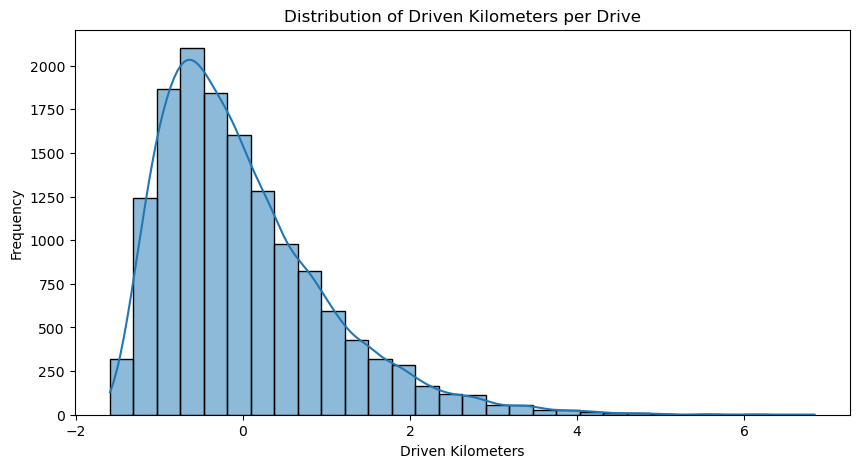

In [16]:
# Exploratory Data Analysis (EDA)

# Histogram using Matplotlib
plt.figure(figsize=(10, 5))
sns.histplot(df_scaled['driven_km_drives'], bins=30, kde=True)
plt.title("Distribution of Driven Kilometers per Drive")
plt.xlabel("Driven Kilometers")
plt.ylabel("Frequency")
plt.show()

In [ ]:
# Count plot for label distribution
plt.figure(figsize=(8, 5))
sns.countplot(x='label', data=df)
plt.title("Retention vs Churn Count")
plt.xlabel("Label (Retention or Churn)")
plt.ylabel("Count")
plt.show()

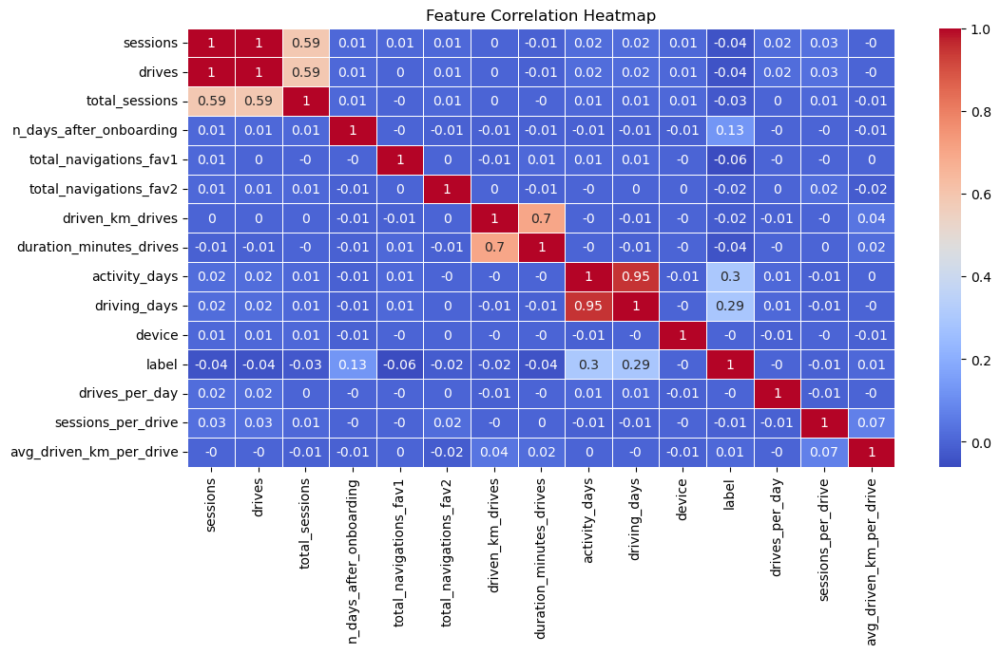

In [17]:
# Correlation Heatmap using Seaborn
plt.figure(figsize=(12, 6))
sns.heatmap(np.round(df_scaled.corr(),2), annot=True,cmap='coolwarm', linewidths=0.5,)
plt.title("Feature Correlation Heatmap")
plt.show()

In [19]:
#Interactive Scatter Plot using Plotly
fig = px.scatter(df_scaled, x='driven_km_drives', y='duration_minutes_drives', color='device',
                 title='Driven KM vs Duration (By Device)')
fig.show()

In [20]:
# Boxplot using Bokeh
output_notebook()
p = bp.figure(title='Boxplot of Activity Days', x_range=['Activity Days'], y_axis_label='Days')
p.vbar(x=['Activity Days'], top=[df_scaled['activity_days'].median()], width=0.5)
show(p)

Loading BokehJS ...

In [24]:
# Boxplot using Bokeh
output_notebook()
p = bp.figure(title='Boxplot of Driven Kilometers by Device', x_range=df['device'].unique(), y_axis_label='Driven Kilometers')
p.vbar(x=df['device'], top=df['driven_km_drives'], width=0.5)
show(p)

Loading BokehJS ...

/Users/DrVaniV/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning:

The figure layout has changed to tight



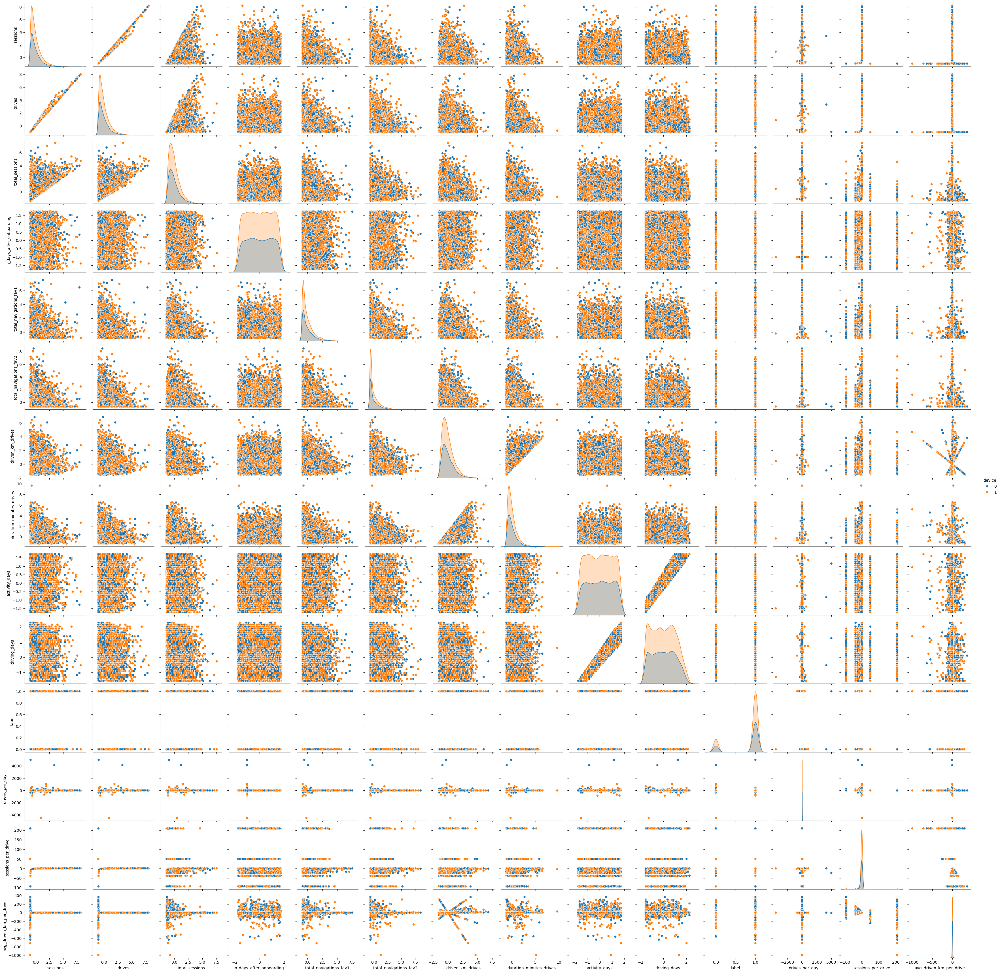

In [31]:
# Pairplot to visualize relationships between numerical variables
sns.pairplot(df, hue='device', diag_kind='kde')
plt.show()


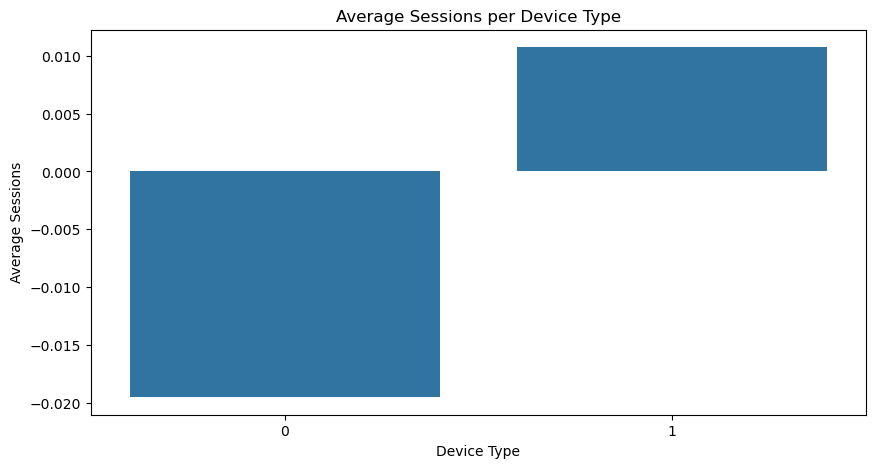

In [32]:
# Bar plot for average sessions per device type
plt.figure(figsize=(10, 5))
sns.barplot(x=df['device'], y=df['sessions'], estimator=np.mean, errorbar=None)
plt.title("Average Sessions per Device Type")
plt.xlabel("Device Type")
plt.ylabel("Average Sessions")
plt.show()



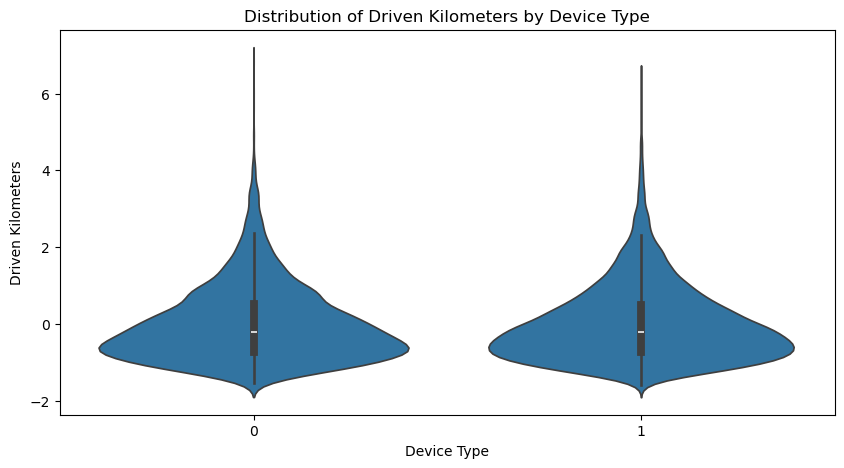

In [33]:
# Violin plot for distribution of driven_km by device type
plt.figure(figsize=(10, 5))
sns.violinplot(x=df['device'], y=df['driven_km_drives'])
plt.title("Distribution of Driven Kilometers by Device Type")
plt.xlabel("Device Type")
plt.ylabel("Driven Kilometers")
plt.show()



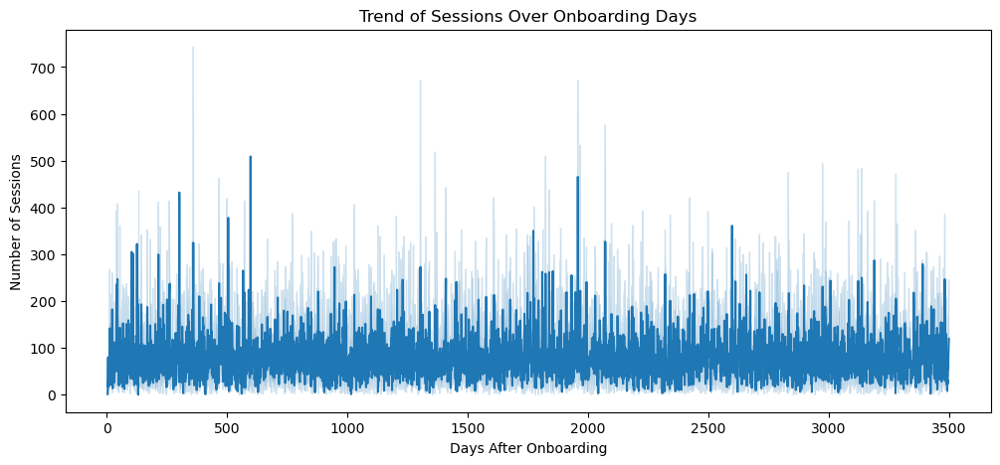

In [28]:
# Line plot for trend of sessions over onboarding days
plt.figure(figsize=(12, 5))
sns.lineplot(x='n_days_after_onboarding', y='sessions', data=df)
plt.title("Trend of Sessions Over Onboarding Days")
plt.xlabel("Days After Onboarding")
plt.ylabel("Number of Sessions")
plt.show()



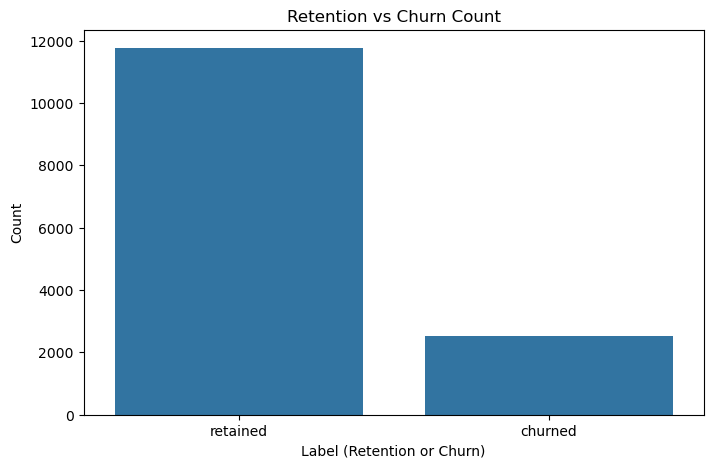